In [1]:
import os

In [5]:
%pwd

'c:\\Users\\adminn\\Documents\\GitHub\\NBA'

In [2]:
os.chdir('../')

In [97]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

# Exploration des données

In [141]:
DATA_PATH='data/nba_logreg.csv'


nba_data=pd.read_csv(DATA_PATH)
nba_data

,Name,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,...,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
0,Brandon Ingram,36,27.4,7.4,2.6,7.6,34.7,0.5,2.1,25.0,...,2.3,69.9,0.7,3.4,4.1,1.9,0.4,0.4,1.3,0.0
1,Andrew Harrison,35,26.9,7.2,2.0,6.7,29.6,0.7,2.8,23.5,...,3.4,76.5,0.5,2.0,2.4,3.7,1.1,0.5,1.6,0.0
2,JaKarr Sampson,74,15.3,5.2,2.0,4.7,42.2,0.4,1.7,24.4,...,1.3,67.0,0.5,1.7,2.2,1.0,0.5,0.3,1.0,0.0
3,Malik Sealy,58,11.6,5.7,2.3,5.5,42.6,0.1,0.5,22.6,...,1.3,68.9,1.0,0.9,1.9,0.8,0.6,0.1,1.0,1.0
4,Matt Geiger,48,11.5,4.5,1.6,3.0,52.4,0.0,0.1,0.0,...,1.9,67.4,1.0,1.5,2.5,0.3,0.3,0.4,0.8,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1335,Chris Smith,80,15.8,4.3,1.6,3.6,43.3,0.0,0.2,14.3,...,1.5,79.2,0.4,0.8,1.2,2.5,0.6,0.2,0.8,0.0
1336,Brent Price,68,12.6,3.9,1.5,4.1,35.8,0.1,0.7,16.7,...,1.0,79.4,0.4,1.1,1.5,2.3,0.8,0.0,1.3,1.0
1337,Marlon Maxey,43,12.1,5.4,2.2,3.9,55.0,0.0,0.0,0.0,...,1.6,64.3,1.5,2.3,3.8,0.3,0.3,0.4,0.9,0.0
1338,Litterial Green,52,12.0,4.5,1.7,3.8,43.9,0.0,0.2,10.0,...,1.8,62.5,0.2,0.4,0.7,2.2,0.4,0.1,0.8,1.0


In [142]:
print(nba_data.shape)

(1340, 21)


In [143]:
nba_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340 entries, 0 to 1339
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Name         1340 non-null   object 
 1   GP           1340 non-null   int64  
 2   MIN          1340 non-null   float64
 3   PTS          1340 non-null   float64
 4   FGM          1340 non-null   float64
 5   FGA          1340 non-null   float64
 6   FG%          1340 non-null   float64
 7   3P Made      1340 non-null   float64
 8   3PA          1340 non-null   float64
 9   3P%          1329 non-null   float64
 10  FTM          1340 non-null   float64
 11  FTA          1340 non-null   float64
 12  FT%          1340 non-null   float64
 13  OREB         1340 non-null   float64
 14  DREB         1340 non-null   float64
 15  REB          1340 non-null   float64
 16  AST          1340 non-null   float64
 17  STL          1340 non-null   float64
 18  BLK          1340 non-null   float64
 19  TOV   

In [144]:
nba_data[nba_data.duplicated()]

,Name,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,...,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
163,Charles Smith,60,8.7,2.9,1.0,2.2,44.4,0.0,0.1,0.0,...,1.3,69.7,0.2,0.9,1.2,1.7,0.6,0.1,0.6,1.0
166,Charles Smith,71,30.4,16.3,6.1,12.4,49.5,0.0,0.0,0.0,...,5.5,72.5,2.4,4.1,6.5,1.5,1.0,1.3,2.1,1.0
169,Charles Smith,34,8.6,3.5,1.4,3.7,39.2,0.4,1.4,31.9,...,0.3,54.5,0.4,0.4,0.8,0.6,0.3,0.2,0.8,1.0
243,Reggie Williams,35,24.5,10.4,4.3,12.2,35.6,0.4,1.7,22.4,...,1.9,72.7,1.6,1.8,3.4,1.7,0.8,0.6,1.8,1.0
339,Ken Johnson,64,12.7,4.1,1.8,3.3,52.8,0.0,0.0,NaN,...,1.3,43.5,1.4,2.4,3.8,0.3,0.2,0.3,0.9,0.0
366,Charles Jones,78,20.1,8.4,3.0,5.8,52.0,0.0,0.1,0.0,...,3.6,64.8,1.8,3.3,5.1,1.6,0.6,0.8,1.8,0.0
369,Charles Jones,29,16.4,3.7,1.3,4.2,31.7,0.7,2.1,31.1,...,0.8,50.0,0.3,1.1,1.4,1.4,0.6,0.2,1.0,0.0
504,Eddie Johnson,74,20.5,9.3,4.0,8.7,45.9,0.0,0.1,9.1,...,2.0,66.4,1.7,2.6,4.4,1.5,0.7,0.2,1.3,1.0
733,Gerald Henderson,43,8.3,2.6,0.9,2.4,35.6,0.1,0.4,21.1,...,1.1,74.5,0.3,0.9,1.3,0.3,0.2,0.2,0.3,1.0
824,Marcus Williams,79,16.6,6.8,2.6,6.7,39.5,0.6,2.1,28.2,...,1.1,84.7,0.4,1.7,2.1,3.3,0.4,0.0,1.8,0.0


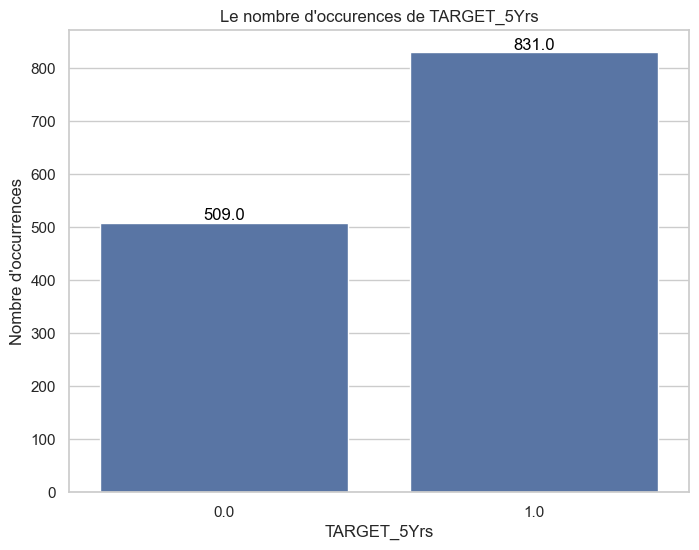

In [145]:
plt.figure(figsize=(8, 6))
plot = sns.countplot(data=nba_data, x="TARGET_5Yrs")
for p in plot.patches:
    plot.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')
plt.title("Le nombre d'occurences de TARGET_5Yrs")
plt.xlabel("TARGET_5Yrs")
plt.ylabel("Nombre d'occurrences")

plt.show()

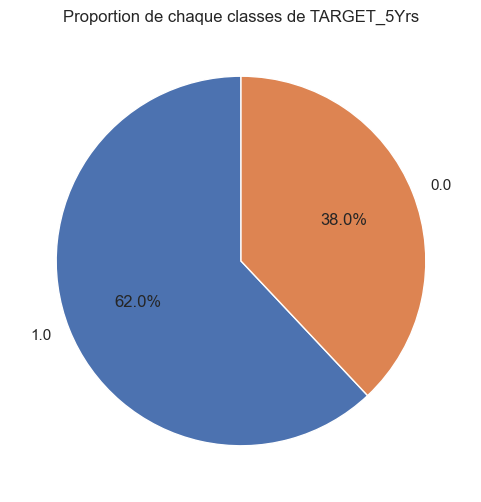

In [146]:
class_counts = nba_data['TARGET_5Yrs'].value_counts()
class_prop = class_counts / len(nba_data)
plt.figure(figsize=(6, 6))
plt.pie(class_prop, labels=class_prop.index, autopct='%1.1f%%', startangle=90)
plt.title("Proportion de chaque classes de TARGET_5Yrs")
plt.show()

# Comments:
- Not all columns have missing data, except for the 3P% column.
- The 3P% column has 11 missing values.
- There are duplicates in the data, but we are keeping them because even though player names are repeated, the associated data is different.
- The classes are not balanced, with class 0 being underrepresented. To address this issue, we can consider different solutions:
    - Give additional weight to the minority class, which is class 0.
    - Generate synthetic data using the SMOTE method.
    - Use Ensemble Learning models, but this may pose challenges as we have limited data and may risk overfitting.

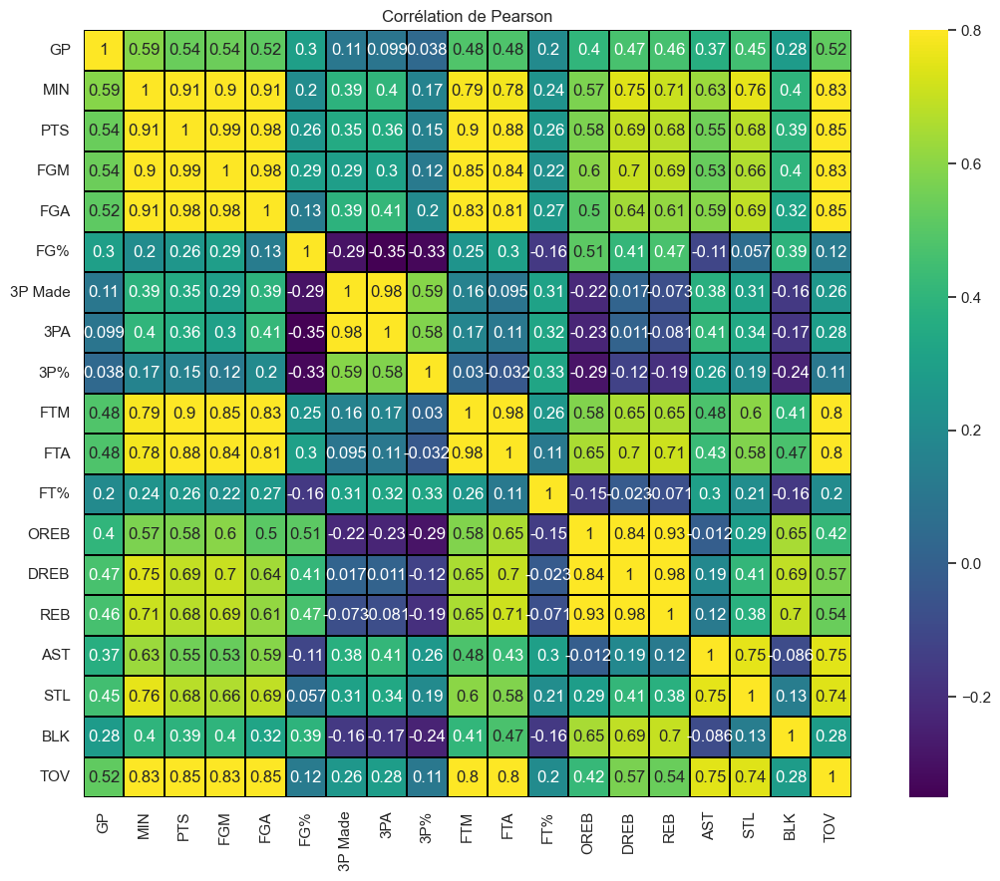

In [147]:
plt.figure(figsize=(15,10))
corr_mat=nba_data.select_dtypes(np.number).drop('TARGET_5Yrs',axis=1).corr()

sns.heatmap(corr_mat,square=True,linewidths=0.01,vmax=0.8,annot=True,cmap='viridis',linecolor='black',annot_kws={'size':12})
plt.title("Corrélation de Pearson")
plt.show()

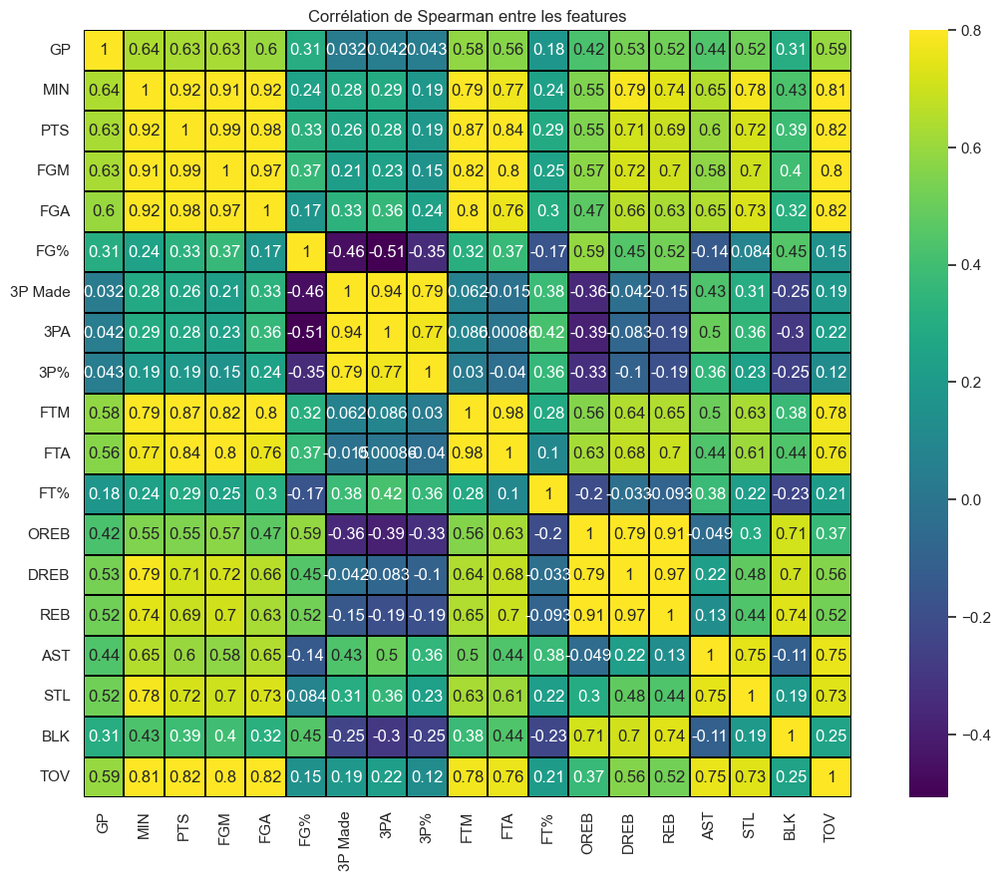

In [148]:

plt.figure(figsize=(15,10))
corr_mat=nba_data.select_dtypes(np.number).drop('TARGET_5Yrs',axis=1).corr('spearman')

sns.heatmap(corr_mat,square=True,linewidths=0.01,vmax=0.8,annot=True,cmap='viridis',linecolor='black',annot_kws={'size':12})
plt.title("Corrélation de Spearman entre les features")
plt.show()

## Remarks on Pearson Correlation:

- We observe that some features are strongly correlated, which makes sense from a business perspective. For instance, the correlation between "FGM" and "FGA" is 0.91, and there are several other similar correlations. This indicates that these features contain redundant information. To address this issue, we have two possible options:

    - Create new variables that capture these relationships more meaningfully.
    - Remove one of the redundant features.

- Alternatively, we can keep all the features and perform statistical tests to determine which ones have a statistically significant impact.

## Remarks on Spearman Correlation:

- We notice some fluctuations between Spearman and Pearson correlations, but nothing significant.

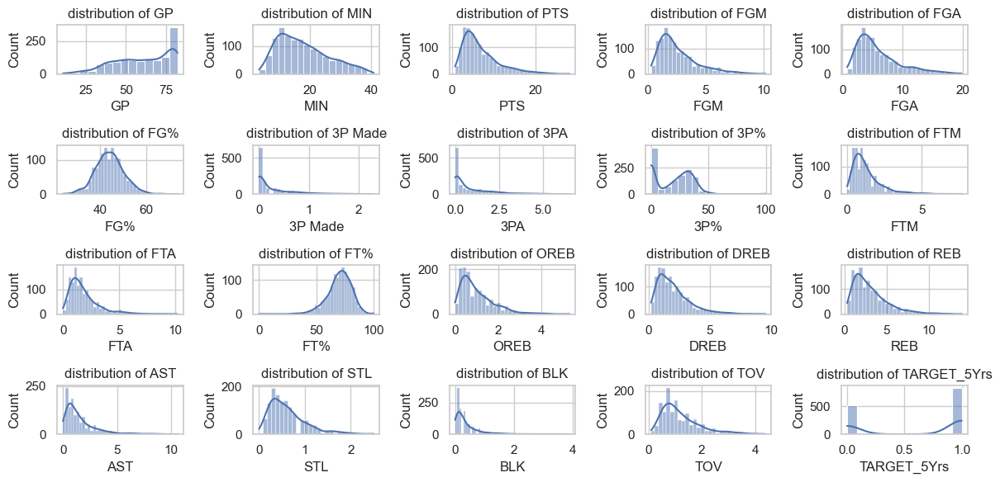

In [149]:
num_feat=nba_data.select_dtypes(include=['int64','float64'])
plt.figure(figsize=(12,6))
for i, col in enumerate(num_feat.columns):

    plt.subplot(4,5,i+1)
    sns.histplot(num_feat[col],kde=True)
    plt.title(f"distribution of {col}")
    plt.xlabel(col)
plt.tight_layout()
plt.show()

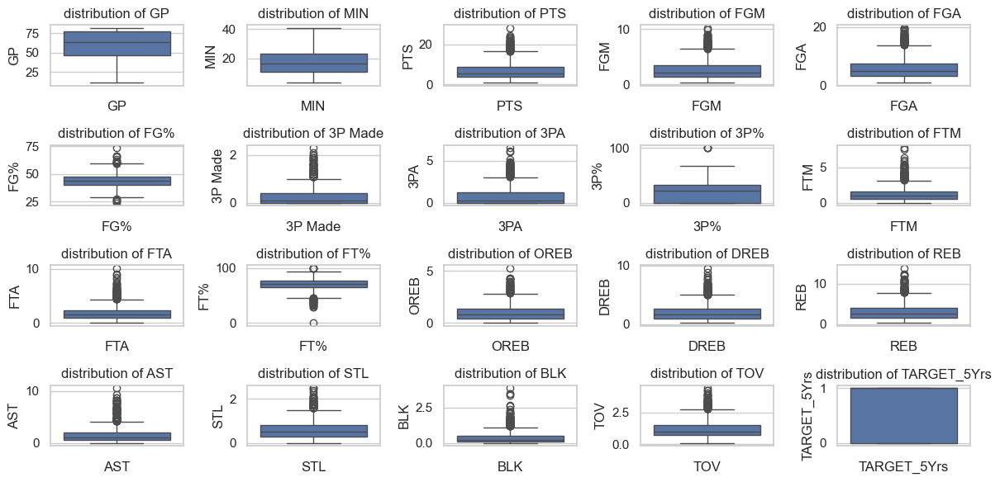

In [150]:
num_feat=nba_data.select_dtypes(include=['int64','float64'])
plt.figure(figsize=(12,6))
for i, col in enumerate(num_feat.columns):

    plt.subplot(4,5,i+1)
    sns.boxplot(num_feat[col])
    plt.title(f"distribution of {col}")
    plt.xlabel(col)
plt.tight_layout()
plt.show()

## Remarks:
- When examining the distribution curves, we observe that most of them exhibit positive skewness, suggesting the presence of several outliers in our dataset.
- There are also a few cases of negative skewness, particularly for the "FT%" variable.
- Regarding the "3P%" column, which has 11 missing values, we might consider using the median as an imputation method since it is less sensitive to outliers.
- From the boxplots and distributions, it is evident that outliers are present. To handle these outliers, I propose using the Interquartile Range (IQR), which is the difference between the third quartile (Q3) and the first quartile (Q1) of a distribution. This method does not assume normal distribution, unlike the z-score method.

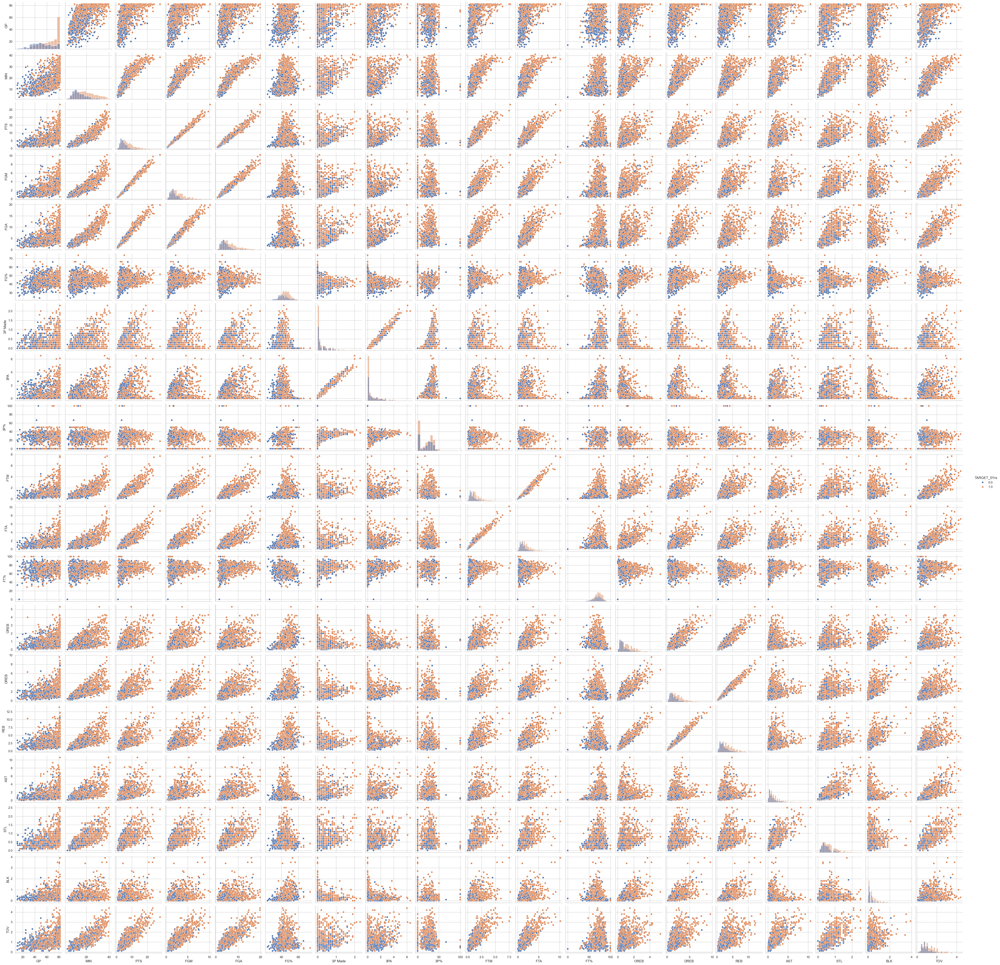

In [108]:
sns.pairplot(data=nba_data, hue='TARGET_5Yrs',diag_kind="hist")
plt.show()

In [151]:
from scipy.stats import kruskal
results = []
numeric_columns = nba_data.drop('TARGET_5Yrs',axis=1).select_dtypes([np.number]).columns
for col in numeric_columns:
    statistic, p_value = kruskal(*[group[col] for name, group in nba_data.groupby('TARGET_5Yrs')])
    observation = 'Significatif' if p_value < 0.05 else 'Non significatif'
    results.append({'Feature': col, 'Kruskal_H': statistic, 'P_value': p_value,"Observation":observation})
kruskal_df = pd.DataFrame(results)
kruskal_df

,Feature,Kruskal_H,P_value,Observation
0,GP,210.945554,8.542303e-48,Significatif
1,MIN,134.860746,3.541570e-31,Significatif
2,PTS,159.130822,1.752090e-36,Significatif
3,FGM,159.189623,1.701017e-36,Significatif
4,FGA,126.258767,2.698934e-29,Significatif
5,FG%,76.508823,2.192313e-18,Significatif
6,3P Made,1.361519,2.432745e-01,Non significatif
7,3PA,1.976972,1.597098e-01,Non significatif
8,3P%,NaN,NaN,Non significatif
9,FTM,155.725893,9.717760e-36,Significatif


# Comments:

- The Kruskal-Wallis test is a non-parametric test designed to quantify the independence between a categorical variable and a numerical variable. The choice of the Kruskal-Wallis test over the ANOVA test is justified because ANOVA makes several assumptions, such as the normality of variables.
- From the statistical test, it is evident that the columns 3PA, 3P%, and 3P Made do not have a significant relationship with TARGET_5Yrs.

# Data Preprocessing

In this section, we will focus on data preprocessing, which involves handling outliers and imputing missing values.

- Before starting the preprocessing, it is essential to perform a data split to prevent any form of data leakage, i.e., the leakage of training data into the test data.

- For preprocessing, we have opted for imputation using the median and removal of outlier values.

In [212]:
from sklearn.model_selection import train_test_split

train,test=train_test_split(nba_data,test_size=0.2,shuffle=True,stratify=nba_data['TARGET_5Yrs'],random_state=42)


In [213]:
print(train.shape)
print(test.shape)

(1072, 21)
(268, 21)


In [214]:
num_col=list(train.drop(['TARGET_5Yrs'],axis=1).select_dtypes(include=['int64','float64']))
for col in num_col:

        q1=train[col].quantile(0.25)
        q3=train[col].quantile(0.75)
        IQR=q3-q1
        lb=q1-1.5*IQR
        up=q3+1.5*IQR

        train=train[(train[col]>=lb) & (train[col]<=up)]


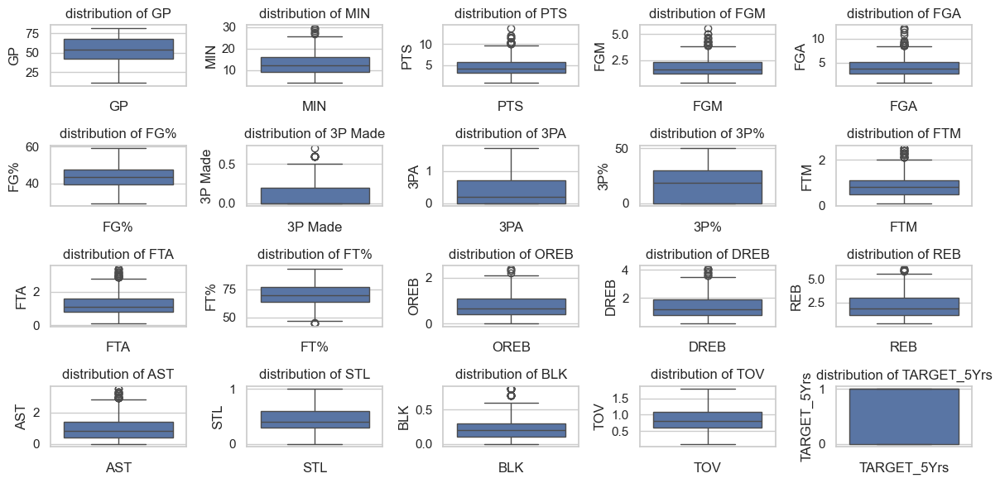

In [190]:
num_feat=train.select_dtypes(include=['int64','float64'])
plt.figure(figsize=(12,6))
for i, col in enumerate(num_feat.columns):

    plt.subplot(4,5,i+1)
    sns.boxplot(num_feat[col])
    plt.title(f"distribution of {col}")
    plt.xlabel(col)
plt.tight_layout()
plt.show()

In [215]:
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(strategy='median')

train["3P%"]=imputer.fit_transform(train[['3P%']])
test["3P%"]=imputer.transform(test[['3P%']])

# Feature Selection



In [216]:
train.drop('Name',axis=1,inplace=True)


In [239]:
X_train=train.drop('TARGET_5Yrs',axis=1)
y_train=train[['TARGET_5Yrs']].values.ravel()
X_test=test.drop(['TARGET_5Yrs','Name'],axis=1)
y_test=test[['TARGET_5Yrs']].values.ravel()

In [256]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, roc_curve, auc, confusion_matrix

def train_and_evaluate_models(X_train, y_train, X_test, y_test):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Logistic Regression
    param_grid_lr = {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'penalty': ['l1', 'l2'],
    }
    grid_search_lr = GridSearchCV(
        estimator=LogisticRegression(class_weight='balanced', solver='liblinear'),
        param_grid=param_grid_lr,
        scoring='recall',
        cv=5,
        verbose=1,
    )
    grid_search_lr.fit(X_train_scaled, y_train)
    best_params_lr = grid_search_lr.best_params_
    best_score_lr = grid_search_lr.best_score_
    best_lr = LogisticRegression(class_weight='balanced', solver='liblinear', **best_params_lr)
    best_lr.fit(X_train_scaled, y_train)

    y_pred_lr = best_lr.predict(X_test_scaled)
    y_prob_lr = best_lr.predict_proba(X_test_scaled)[:, 1]

    print("Best parameters for Logistic Regression:", best_params_lr)
    print("Best rappel score for Logistic Regression:", best_score_lr)
    print(classification_report(y_test, y_pred_lr))
    cm_lr = confusion_matrix(y_test, y_pred_lr)
    print("Confusion Matrix for Logistic Regression:")
    print(cm_lr)
    param_grid_svc = {
        'C': [0.001, 0.01, 0.1, 1, 10],
        'kernel': ['linear', 'rbf'],
    }
    grid_search_svc = GridSearchCV(
        estimator=SVC(class_weight='balanced', probability=True),
        param_grid=param_grid_svc,
        scoring='recall',
        cv=5,
        verbose=1,
    )
    grid_search_svc.fit(X_train_scaled, y_train)
    best_params_svc = grid_search_svc.best_params_
    best_score_svc = grid_search_svc.best_score_
    best_svc = SVC(class_weight='balanced', probability=True, **best_params_svc)
    best_svc.fit(X_train_scaled, y_train)

    y_pred_svc = best_svc.predict(X_test_scaled)
    y_prob_svc = best_svc.predict_proba(X_test_scaled)[:, 1]

    print("Best parameters for SVC:", best_params_svc)
    print("Best recall score for SVC:", best_score_svc)
    print(classification_report(y_test, y_pred_svc))
    cm_svc = confusion_matrix(y_test, y_pred_svc)
    print("Confusion Matrix for SVC:")
    print(cm_svc)
    fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test, y_prob_lr)
    roc_auc_lr = auc(fpr_lr, tpr_lr)
    fpr_svc, tpr_svc, thresholds_svc = roc_curve(y_test, y_prob_svc)
    roc_auc_svc = auc(fpr_svc, tpr_svc)
    plt.figure()
    plt.plot(fpr_lr, tpr_lr, color='darkorange', lw=2, label='ROC curve (Logistic Regression, area = {:.2f})'.format(roc_auc_lr))
    plt.plot(fpr_svc, tpr_svc, color='cornflowerblue', lw=2, label='ROC curve (SVC, area = {:.2f})'.format(roc_auc_svc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Taux de faux positifs')
    plt.ylabel('Taux de vrais positifs')
    plt.title('Courbes ROC AUC')
    plt.legend(loc='lower right')
    plt.show()

    return best_lr, best_svc

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for Logistic Regression: {'C': 0.1, 'penalty': 'l2'}
Best ROC AUC score for Logistic Regression: 0.6165034965034966
              precision    recall  f1-score   support

         0.0       0.63      0.63      0.63       102
         1.0       0.77      0.77      0.77       166

    accuracy                           0.72       268
   macro avg       0.70      0.70      0.70       268
weighted avg       0.72      0.72      0.72       268

Confusion Matrix for Logistic Regression:
[[ 64  38]
 [ 38 128]]
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for SVC: {'C': 0.001, 'kernel': 'rbf'}
Best recall score for SVC: 1.0
              precision    recall  f1-score   support

         0.0       0.38      1.00      0.55       102
         1.0       0.00      0.00      0.00       166

    accuracy                           0.38       268
   macro avg       0.19      0.50      0.28       

c:\Users\adminn\Documents\GitHub\NBA\env\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\adminn\Documents\GitHub\NBA\env\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\adminn\Documents\GitHub\NBA\env\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


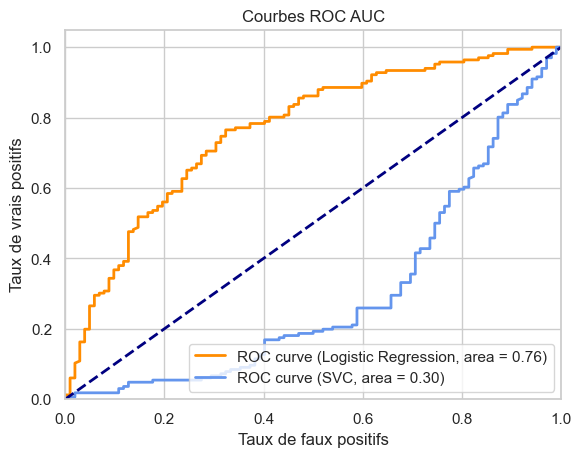

In [257]:
best_lr,best_svc=train_and_evaluate_models(X_train, y_train, X_test, y_test)


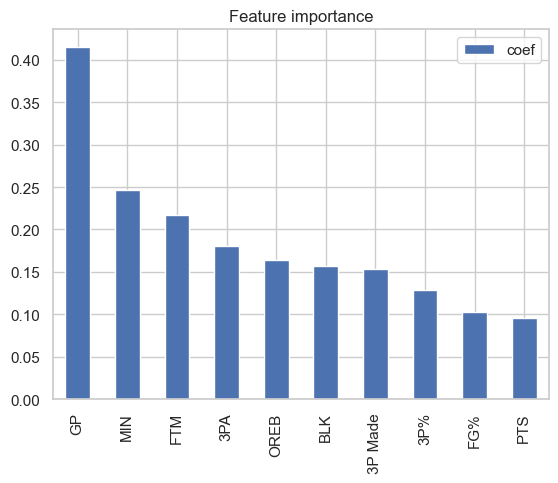

In [258]:
pd.DataFrame(np.abs(best_lr.coef_.reshape(-1,1)),index=X_train.columns,columns=['coef']).sort_values(by=['coef'],ascending=False).head(10).plot(kind='bar')
plt.title("Feature importance")
plt.show()

In [254]:
pd.DataFrame(np.abs(best_lr.coef_.reshape(-1,1)),index=X_train.columns,columns=['coef']).sort_values(by=['coef'],ascending=False).head(9).index

Index(['GP', 'MIN', 'FTM', '3PA', 'OREB', 'BLK', '3P Made', '3P%', 'FG%'], dtype='object')

# Remarques:

- Nous avons opté pour le rappel comme métrique de performance, car nous nous sommes mis à la place d'investisseurs prêts à prendre des risques pour maximiser leurs chances de repérer des talents émergents. Cette approche vise à minimiser le risque de passer à côté de futurs talents, même si cela implique d'accepter quelques investissements moins forts (faux positifs).

In [246]:
from sklearn.metrics import precision_score, recall_score, f1_score

def eval_metrics(actual,pred):

    precision=precision_score(actual,pred)
    recall=recall_score(actual,pred)
    f1=f1_score(actual,pred)

    return precision,recall,f1

    

In [259]:
best_lr

LogisticRegression(C=0.1, class_weight='balanced', solver='liblinear')

[[ 9 10 11  5  6  7  8  9 80]]


c:\Users\adminn\Documents\GitHub\NBA\env\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


array([1.])

hello


25
